# **Car Sales Price Prediction Through Classification Models**

This notebook shows 

 ## **Table of Content**


1.   *Importing Libraries*
2.   *Data Loading and Inspection*
3.   *Data Cleaning*
4.   *Data Exploration and Preparation*
5.   *Exploratory Data Analysis*
6.   *Machine Learning Model*
7.   *Support Vector Machine Classifier*
8.   *Decision Tree Classifier*
9.   *Random Forest Classifier*
10.  *Gradient Boosting Classifier*
11.  *KNeighbors Classifier*
12.  *Predictions of price of cars Using KNN Classifier*
13.  *Macro Accuracy of All Classifiers*
14.  *Micro Accuracy of All Classifiers*




















#### **Importing Libraries**

In [ ]:
%config InlineBackend.figure_formats = set(('retina', 'svg'))
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 
#sns.set(style='ticks', font_scale=0.8)

#### **Data Loading and inspection**
###### Data is in csv file format which is loaded and displayed using python library pandas. now we can do different manipulations using this dataset to create various models.

In [ ]:
dataframe= pd.read_csv('/content/classification adverts.csv')
dataframe.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,body_type,crossover_car_and_van,fuel_type,make_model,age,price_band
0,202010014440649,31534.0,17,Grey,MINI,Hatch,USED,2017.0,Hatchback,False,Petrol,MINI - Hatch,5,high
1,202010155026725,52023.0,66,Blue,Volkswagen,Golf,USED,2016.0,Estate,False,Diesel,Volkswagen - Golf,6,high
2,202008142485309,29500.0,12,Grey,Mercedes-Benz,C Class,USED,2012.0,Saloon,False,Petrol,Mercedes-Benz - C Class,10,medium
3,202009183894045,35300.0,18,Grey,Vauxhall,Corsa,USED,2018.0,Hatchback,False,Petrol,Vauxhall - Corsa,4,medium
4,202010014441671,47299.0,65,Black,Nissan,Qashqai,USED,2016.0,SUV,False,Diesel,Nissan - Qashqai,6,high


## **Data Cleaning**

Data cleaning or cleansing is the process of detecting and correcting (or removing) corrupt or inaccurate records from a record set, table, or database and refers to identifying incomplete, incorrect, inaccurate or irrelevant parts of the data and then replacing, modifying, or deleting the dirty or coarse data.

In [ ]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96269 entries, 0 to 96268
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   public_reference       96269 non-null  int64  
 1   mileage                96247 non-null  float64
 2   reg_code               96257 non-null  object 
 3   standard_colour        96269 non-null  object 
 4   standard_make          96269 non-null  object 
 5   standard_model         96269 non-null  object 
 6   vehicle_condition      96269 non-null  object 
 7   year_of_registration   96269 non-null  float64
 8   body_type              96269 non-null  object 
 9   crossover_car_and_van  96269 non-null  bool   
 10  fuel_type              96269 non-null  object 
 11  make_model             96269 non-null  object 
 12  age                    96269 non-null  int64  
 13  price_band             96269 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(9)
memory usa

In [ ]:
dataframe.dtypes

public_reference           int64
mileage                  float64
reg_code                  object
standard_colour           object
standard_make             object
standard_model            object
vehicle_condition         object
year_of_registration     float64
body_type                 object
crossover_car_and_van       bool
fuel_type                 object
make_model                object
age                        int64
price_band                object
dtype: object

In [ ]:
dataframe.columns

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'body_type', 'crossover_car_and_van',
       'fuel_type', 'make_model', 'age', 'price_band'],
      dtype='object')

In [ ]:
dataframe.shape

(96269, 14)

In [ ]:
dataframe.describe()

,public_reference,mileage,year_of_registration,age
count,9.626900e+04,96247.000000,96269.000000,96269.000000
mean,2.020082e+14,42964.067150,2015.096075,6.903925
std,1.194558e+10,34051.708175,3.766205,3.766205
min,2.014120e+14,0.000000,1962.000000,2.000000
25%,2.020091e+14,17000.000000,2013.000000,4.000000
50%,2.020100e+14,34352.000000,2016.000000,6.000000
75%,2.020102e+14,62000.000000,2018.000000,9.000000
max,2.020110e+14,999999.000000,2020.000000,60.000000


In [ ]:
for col in dataframe.columns:
    pct_missing = np.mean(dataframe[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

public_reference - 0%
mileage - 0%
reg_code - 0%
standard_colour - 0%
standard_make - 0%
standard_model - 0%
vehicle_condition - 0%
year_of_registration - 0%
body_type - 0%
crossover_car_and_van - 0%
fuel_type - 0%
make_model - 0%
age - 0%
price_band - 0%


In [ ]:
dataframe.isnull().sum()

public_reference          0
mileage                  22
reg_code                 12
standard_colour           0
standard_make             0
standard_model            0
vehicle_condition         0
year_of_registration      0
body_type                 0
crossover_car_and_van     0
fuel_type                 0
make_model                0
age                       0
price_band                0
dtype: int64

In [ ]:
dataframe.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
96264    False
96265    False
96266    False
96267    False
96268    False
Length: 96269, dtype: bool

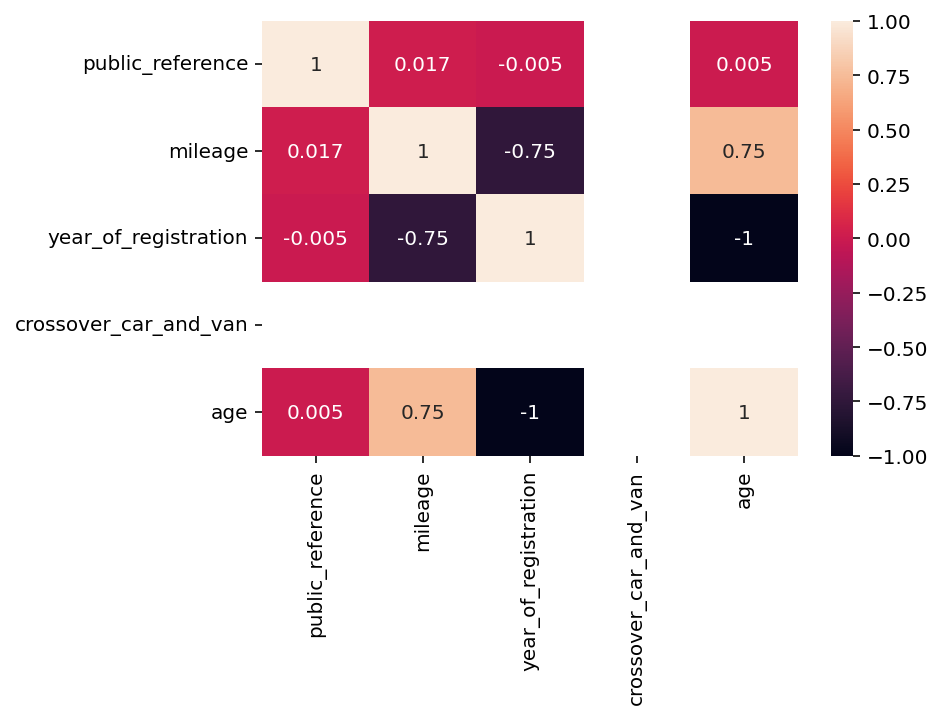

In [ ]:
correlation= dataframe.corr()
sns.heatmap(correlation,annot=True)

In [ ]:
dataframe.columns

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'body_type', 'crossover_car_and_van',
       'fuel_type', 'make_model', 'age', 'price_band'],
      dtype='object')

In [ ]:
#numeric columns in dataset
dataframe_numeric=dataframe.select_dtypes(include=[np.number])
numeric_cols=dataframe_numeric.columns.values
print(numeric_cols)

['public_reference' 'mileage' 'year_of_registration' 'age']


In [ ]:
#non numeric columns in dataset
dataframe_non_numeric=dataframe.select_dtypes(exclude=[np.number])
non_numeric_cols=dataframe_non_numeric.columns.values
print(non_numeric_cols)

['reg_code' 'standard_colour' 'standard_make' 'standard_model'
 'vehicle_condition' 'body_type' 'crossover_car_and_van' 'fuel_type'
 'make_model' 'price_band']


In [ ]:
dataframe.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,body_type,crossover_car_and_van,fuel_type,make_model,age,price_band
0,202010014440649,31534.0,17,Grey,MINI,Hatch,USED,2017.0,Hatchback,False,Petrol,MINI - Hatch,5,high
1,202010155026725,52023.0,66,Blue,Volkswagen,Golf,USED,2016.0,Estate,False,Diesel,Volkswagen - Golf,6,high
2,202008142485309,29500.0,12,Grey,Mercedes-Benz,C Class,USED,2012.0,Saloon,False,Petrol,Mercedes-Benz - C Class,10,medium
3,202009183894045,35300.0,18,Grey,Vauxhall,Corsa,USED,2018.0,Hatchback,False,Petrol,Vauxhall - Corsa,4,medium
4,202010014441671,47299.0,65,Black,Nissan,Qashqai,USED,2016.0,SUV,False,Diesel,Nissan - Qashqai,6,high


In [ ]:
dataframe.drop_duplicates(inplace=True)

In [ ]:
dataframe.isnull().sum()

public_reference          0
mileage                  22
reg_code                 12
standard_colour           0
standard_make             0
standard_model            0
vehicle_condition         0
year_of_registration      0
body_type                 0
crossover_car_and_van     0
fuel_type                 0
make_model                0
age                       0
price_band                0
dtype: int64

In [ ]:
dataframe['mileage'].value_counts(normalize=True,dropna=False)

10.0        0.005578
60000.0     0.004674
50000.0     0.004477
80000.0     0.004072
40000.0     0.004062
              ...   
29559.0     0.000010
130893.0    0.000010
51120.0     0.000010
65686.0     0.000010
33952.0     0.000010
Name: mileage, Length: 42439, dtype: float64

In [ ]:
dataframe['reg_code'].value_counts(normalize=True,dropna=False)

17     0.106140
67     0.088107
66     0.078883
69     0.060009
16     0.055646
19     0.049611
18     0.048240
65     0.043430
15     0.039483
64     0.038860
68     0.037728
14     0.032316
63     0.030965
20     0.029594
13     0.027070
62     0.025439
12     0.022437
61     0.020972
11     0.018531
70     0.018230
60     0.016838
10     0.015176
59     0.014221
09     0.010626
08     0.010398
07     0.009110
57     0.008362
58     0.008300
56     0.006025
06     0.005163
55     0.004300
05     0.003895
54     0.003012
04     0.002950
53     0.002213
03     0.001839
52     0.001226
02     0.001143
51     0.000789
Y      0.000540
X      0.000343
W      0.000291
V      0.000260
T      0.000187
P      0.000177
M      0.000156
R      0.000125
S      0.000125
NaN    0.000125
N      0.000093
L      0.000093
H      0.000073
F      0.000031
K      0.000031
G      0.000021
A      0.000021
J      0.000010
D      0.000010
E      0.000010
Name: reg_code, dtype: float64

In [ ]:
dataframe['mileage'].unique()

array([ 31534.,  52023.,  29500., ...,  17482., 131980.,  52760.])

In [ ]:
dataframe['mileage']=dataframe['mileage'].fillna(dataframe['mileage'].median())

In [ ]:
dataframe['reg_code'].unique()

array(['17', '66', '12', '18', '65', '19', '64', '09', '61', '16', '20',
       '10', '15', '67', '58', '69', '13', '68', '70', '11', '14', '63',
       '08', '62', '60', '52', '57', '04', '56', '07', '53', '59', 'S',
       '06', '55', '54', '03', 'V', 'L', '02', '05', 'M', 'Y', '51', 'X',
       'R', 'P', 'N', 'W', 'H', nan, 'T', 'D', 'A', 'G', 'F', 'K', 'E',
       'J'], dtype=object)

In [ ]:
dataframe.drop(['reg_code'],axis=1,inplace=True)

In [ ]:
dataframe.isnull().sum()

public_reference         0
mileage                  0
standard_colour          0
standard_make            0
standard_model           0
vehicle_condition        0
year_of_registration     0
body_type                0
crossover_car_and_van    0
fuel_type                0
make_model               0
age                      0
price_band               0
dtype: int64

### Now the columns of dataset are cleaned as none of the column consist of missing values.

## **Data Exploration and Preparation**

The data preparation process involves collecting, cleaning, and consolidating data into a file that can be further used for analysis.
based on the information provided in dataset we find some of the columns which are unlikely to contribute in machine learning model therefore we will drop those columns.




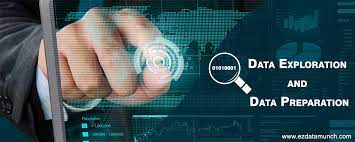

In [ ]:
dataframe.head()

,public_reference,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,body_type,crossover_car_and_van,fuel_type,make_model,age,price_band
0,202010014440649,31534.0,Grey,MINI,Hatch,USED,2017.0,Hatchback,False,Petrol,MINI - Hatch,5,high
1,202010155026725,52023.0,Blue,Volkswagen,Golf,USED,2016.0,Estate,False,Diesel,Volkswagen - Golf,6,high
2,202008142485309,29500.0,Grey,Mercedes-Benz,C Class,USED,2012.0,Saloon,False,Petrol,Mercedes-Benz - C Class,10,medium
3,202009183894045,35300.0,Grey,Vauxhall,Corsa,USED,2018.0,Hatchback,False,Petrol,Vauxhall - Corsa,4,medium
4,202010014441671,47299.0,Black,Nissan,Qashqai,USED,2016.0,SUV,False,Diesel,Nissan - Qashqai,6,high


### we will drop columns public_reference, crossover_car_and_van and vehicle_condition since they are unlikely to be used in classification machine learning models.

In [ ]:
dataframe.drop(['public_reference'],axis=1,inplace=True)

In [ ]:
dataframe.drop(['crossover_car_and_van'],axis=1,inplace=True)

In [ ]:
dataframe.drop(['vehicle_condition'],axis=1,inplace=True)

In [ ]:
dataframe.head()

,mileage,standard_colour,standard_make,standard_model,year_of_registration,body_type,fuel_type,make_model,age,price_band
0,31534.0,Grey,MINI,Hatch,2017.0,Hatchback,Petrol,MINI - Hatch,5,high
1,52023.0,Blue,Volkswagen,Golf,2016.0,Estate,Diesel,Volkswagen - Golf,6,high
2,29500.0,Grey,Mercedes-Benz,C Class,2012.0,Saloon,Petrol,Mercedes-Benz - C Class,10,medium
3,35300.0,Grey,Vauxhall,Corsa,2018.0,Hatchback,Petrol,Vauxhall - Corsa,4,medium
4,47299.0,Black,Nissan,Qashqai,2016.0,SUV,Diesel,Nissan - Qashqai,6,high


## **Exploratory Data Analysis**
EDA is primarily used to see what data can reveal beyond the formal modeling or hypothesis testing task and provides a provides a better understanding of data set variables and the relationships between them. It can also help determine if the statistical techniques you are considering for data analysis are appropriate. 
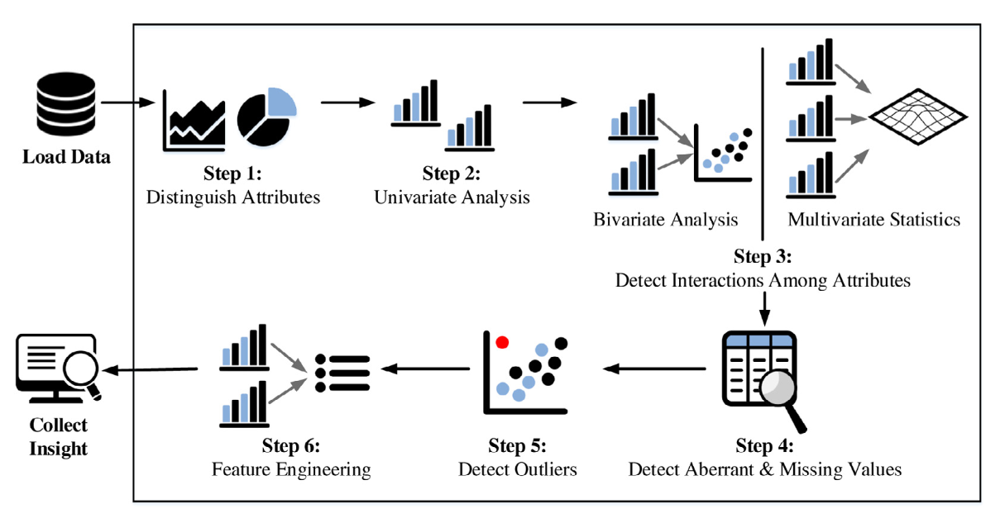

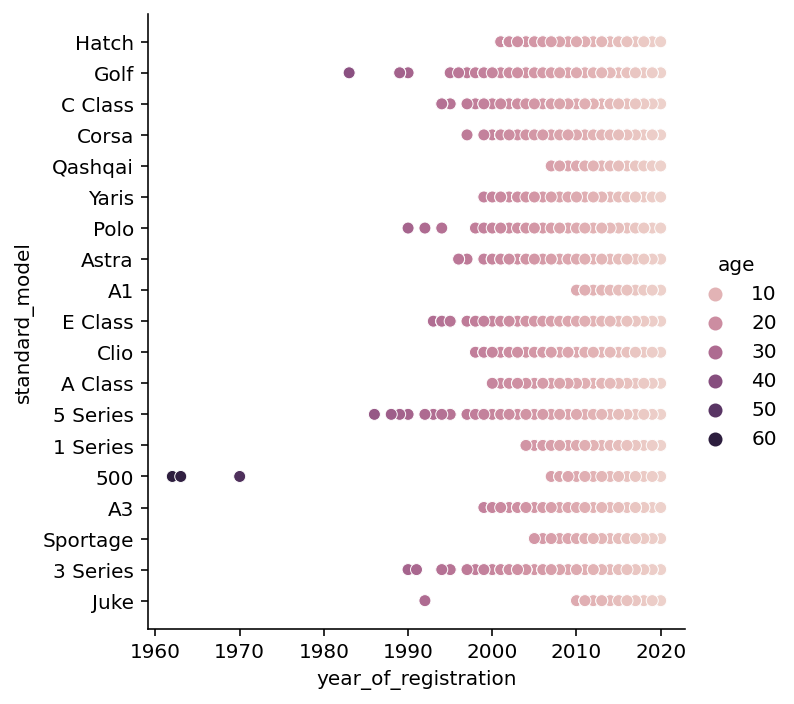

In [ ]:
sns.relplot(x="year_of_registration",y="standard_model",hue="age",data=dataframe)

In [ ]:
dataframe.head()

,mileage,standard_colour,standard_make,standard_model,year_of_registration,body_type,fuel_type,make_model,age,price_band
0,31534.0,Grey,MINI,Hatch,2017.0,Hatchback,Petrol,MINI - Hatch,5,high
1,52023.0,Blue,Volkswagen,Golf,2016.0,Estate,Diesel,Volkswagen - Golf,6,high
2,29500.0,Grey,Mercedes-Benz,C Class,2012.0,Saloon,Petrol,Mercedes-Benz - C Class,10,medium
3,35300.0,Grey,Vauxhall,Corsa,2018.0,Hatchback,Petrol,Vauxhall - Corsa,4,medium
4,47299.0,Black,Nissan,Qashqai,2016.0,SUV,Diesel,Nissan - Qashqai,6,high


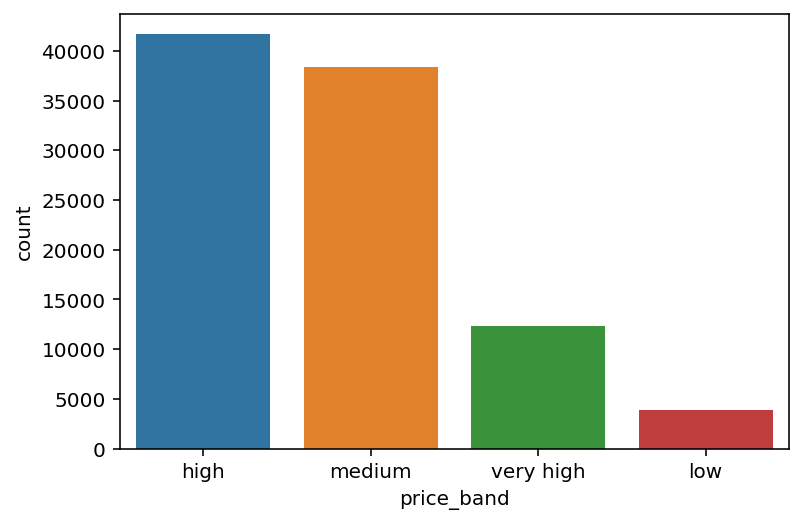

In [ ]:
sns.countplot(x='price_band',data=dataframe)

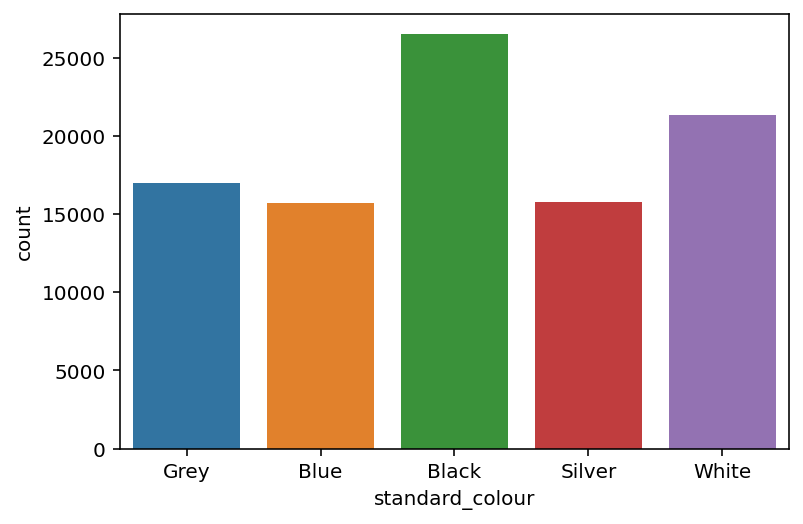

In [ ]:
sns.countplot(x='standard_colour',data=dataframe)

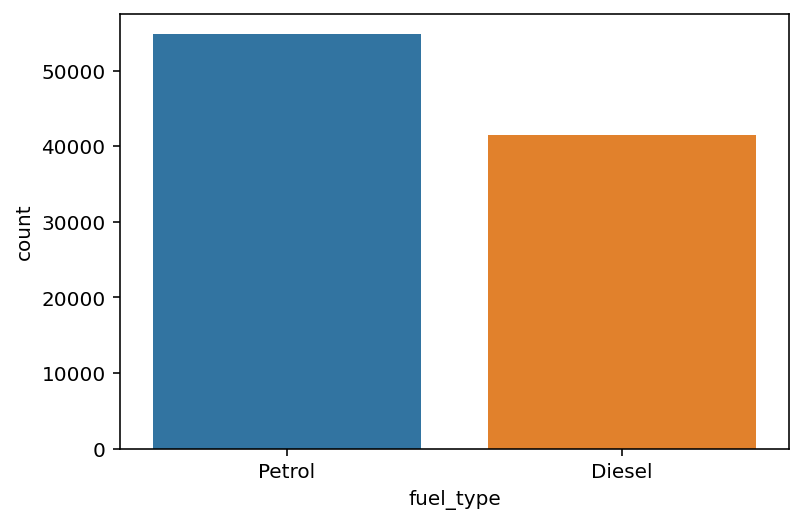

In [ ]:
sns.countplot(x='fuel_type',data=dataframe)

In [ ]:
dataframe.head()

,mileage,standard_colour,standard_make,standard_model,year_of_registration,body_type,fuel_type,make_model,age,price_band
0,31534.0,Grey,MINI,Hatch,2017.0,Hatchback,Petrol,MINI - Hatch,5,high
1,52023.0,Blue,Volkswagen,Golf,2016.0,Estate,Diesel,Volkswagen - Golf,6,high
2,29500.0,Grey,Mercedes-Benz,C Class,2012.0,Saloon,Petrol,Mercedes-Benz - C Class,10,medium
3,35300.0,Grey,Vauxhall,Corsa,2018.0,Hatchback,Petrol,Vauxhall - Corsa,4,medium
4,47299.0,Black,Nissan,Qashqai,2016.0,SUV,Diesel,Nissan - Qashqai,6,high


## **Machine learning model**

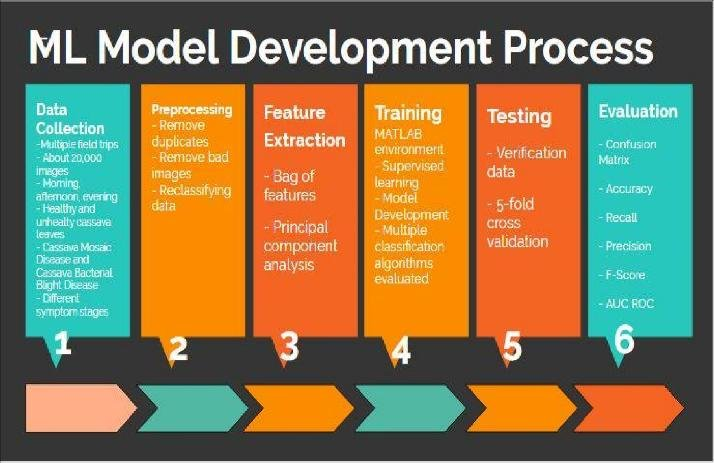

##### **Importing libraries for machine learning model of classification**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn .preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_score

In [ ]:
#converting categorical value in numerical value 
df_cars=dataframe.apply(LabelEncoder().fit_transform)
df_cars.head(5)

,mileage,standard_colour,standard_make,standard_model,year_of_registration,body_type,fuel_type,make_model,age,price_band
0,20707,2,4,13,34,2,1,7,3,0
1,30474,1,10,12,33,1,0,17,4,0
2,19447,2,5,8,29,4,1,9,8,2
3,22907,2,9,10,35,2,1,16,2,2
4,28631,0,6,16,33,3,0,12,4,0


**Since machine learning models can be trained only when we divide the large dataset into train and test dataset i have considered age as test dataset for all classifiers because age can be divided into many classes and these classes are used to find accuracy score through classifiers respectively.**

In [ ]:
x= df_cars[['standard_colour','standard_make','year_of_registration','body_type','age']]
y=df_cars[['price_band']]

In [ ]:
x

,standard_colour,standard_make,year_of_registration,body_type,age
0,2,4,34,2,3
1,1,10,33,1,4
2,2,5,29,4,8
3,2,9,35,2,2
4,0,6,33,3,4
...,...,...,...,...,...
96264,4,5,34,4,3
96265,3,1,24,4,13
96266,3,9,32,2,5
96267,2,6,36,3,1


In [ ]:
y

,price_band
0,0
1,0
2,2
3,2
4,0
...,...
96264,0
96265,1
96266,2
96267,0


In [ ]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=10)

In [ ]:
len(x_train) , len(x_test), len(y_train),len(y_test)

(77015, 19254, 77015, 19254)

**Before training any classification model we will first scale the data**

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import MinMaxScaler

**Scaling the data for training machine learning model**

In [ ]:
scaler=MinMaxScaler()
x_train_scaled=scaler.fit_transform(x_train)
x_test_scaled=scaler.fit_transform(x_test)


In [ ]:
svc_scaled = LinearSVC(C=2, random_state=0).fit(x_train_scaled,y_train)
print("train score - " + str(svc_scaled.score(x_train_scaled, y_train)))
print("test score - " + str(svc_scaled.score(x_test_scaled, y_test)))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train score - 0.6603259105369084
test score - 0.6461514490495481


## **Support Vector Machine Classifier**

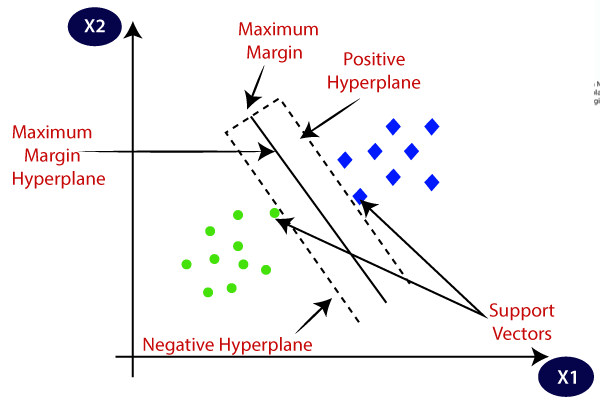

In [ ]:
svc = LinearSVC(random_state=0).fit(x_train,y_train)
print("train score - " + str(svc.score(x_train, y_train)))
print("test score - " + str(svc.score(x_test, y_test)))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train score - 0.5141206258521067
test score - 0.5112184481146774


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [ ]:
svc_pred = svc.predict(x_test)
svc_pred

array([3, 2, 2, ..., 2, 2, 2])

**Confusion matrix code of support vector Classifier**

In [ ]:
#Confusion matrix for support vector machine
from sklearn.metrics import confusion_matrix
svc_cm = confusion_matrix(y_test, svc_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[ 727    0 4565 2999]
 [   0    0  779    1]
 [  48    0 7306  346]
 [ 125    0  373 1985]]

True Positives(TP) =  727

True Negatives(TN) =  0

False Positives(FP) =  0

False Negatives(FN) =  0


**Confusion matrix of support vector classifier**

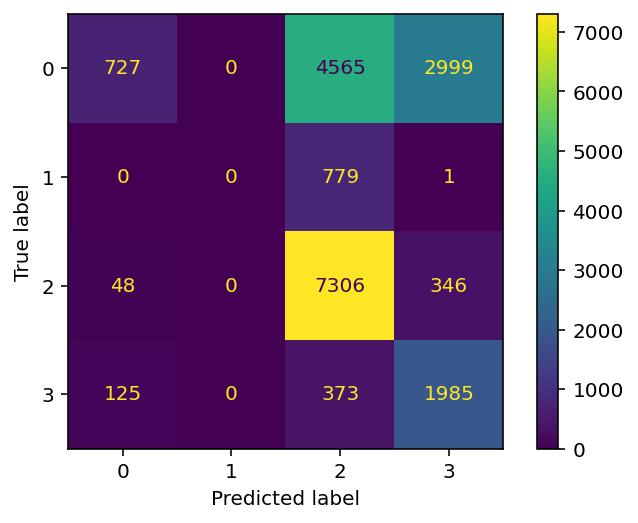

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# The diagonal from the top-left shows the performance on correct predictions
ConfusionMatrixDisplay(svc_cm).plot();

### **After Tunning**
### Increased regularization parameter of age value 

In [ ]:
svc = LinearSVC(C=3, random_state=0).fit(x_train,y_train)
print("train score: " + str(svc.score(x_train, y_train)))
print("test score: " + str(svc.score(x_test, y_test)))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train score: 0.5157177173277933
test score: 0.5203074685779578


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


**Macro and Micro Accuracy of Support vector classifier**

In [ ]:
# Macro and Micro Accuracy
# Average is assigned micro
micro_accuracy_svm = precision_score(y_test, svc_pred, average='micro')
# Average is assigned macro
macro_accuracy_svm = precision_score(y_test, svc_pred, average='macro')
# Printing micro and macro average precision score
print("Average Micro Accuracy of Support Vector machine: ",micro_accuracy_svm)
print("Average Macro Accuracy of Support Vector machine: ",macro_accuracy_svm)

Average Micro Accuracy of Support Vector machine:  0.5203074685779578
Average Macro Accuracy of Support Vector machine:  0.43528390735995376


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Decision Tree Classifier**

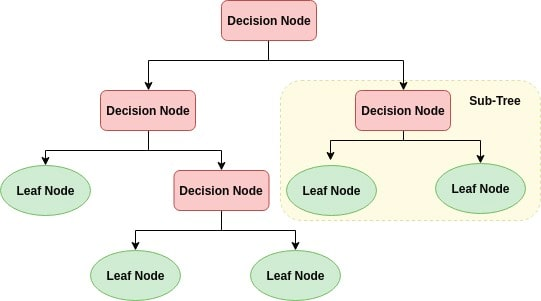

In [ ]:
dec = DecisionTreeClassifier(random_state=0).fit(x_train, y_train)
print("train score: " + str(dec.score(x_train, y_train)))
print("test score: " + str(dec.score(x_test, y_test)))


train score: 0.8200869960397326
test score: 0.8130258647553755


In [ ]:
dec_pred = dec.predict(x_test)
dec_pred

array([3, 2, 0, ..., 2, 0, 2])

**Confusion Matrix code of decision Tree Classifier**

In [ ]:
#Confusion matrix for support vector machine
from sklearn.metrics import confusion_matrix
dec_cm = confusion_matrix(y_test, dec_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[ 727    0 4565 2999]
 [   0    0  779    1]
 [  48    0 7306  346]
 [ 125    0  373 1985]]

True Positives(TP) =  727

True Negatives(TN) =  0

False Positives(FP) =  0

False Negatives(FN) =  0


**Confusion Matrix of Decision Tree Classifier**

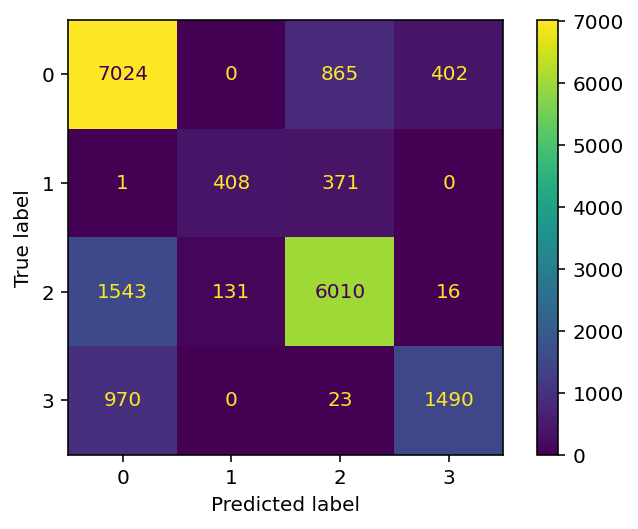

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# The diagonal from the top-left shows the performance on correct predictions
ConfusionMatrixDisplay(dec_cm).plot();

## **After Tunning**
#### pre-prunning by reducing maximum depth to 5

In [ ]:
dec = DecisionTreeClassifier(max_depth=5, random_state=0).fit(x_train, y_train)
print("train score - " + str(dec.score(x_train, y_train)))
print("test score - " + str(dec.score(x_test, y_test)))

train score - 0.7783808349022917
test score - 0.7755271631868702


**Macro and Micro Accuracy of Decision Tree Classifier**

In [ ]:
# Macro and Micro Accuracy
# Average is assigned micro
micro_accuracy_dec = precision_score(y_test, dec_pred, average='micro')
# Average is assigned macro
macro_accuracy_dec = precision_score(y_test, dec_pred, average='macro')
# Printing micro and macro average precision score
print("Average Micro Accuracy of Decision Tree Classifier: ",micro_accuracy_dec)
print("Average Macro Accuracy of Decision Tree Classifier: ",macro_accuracy_dec)

Average Micro Accuracy of Decision Tree Classifier:  0.7755271631868702
Average Macro Accuracy of Decision Tree Classifier:  0.7752753061837965


## **Random Forest Classifier**

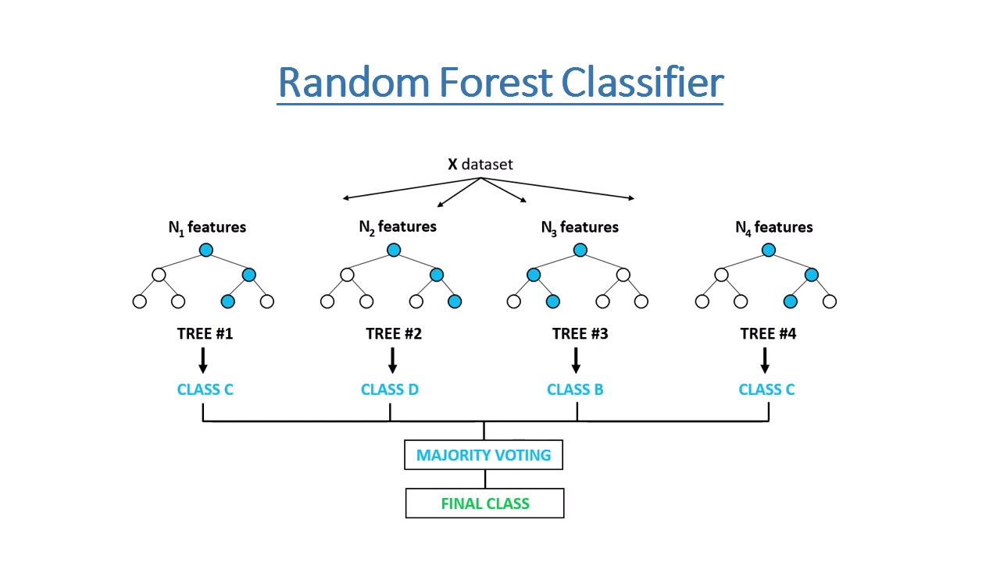

In [ ]:
forest = RandomForestClassifier(n_estimators=10, random_state=0).fit(x_train, y_train)
print("train score - " + str(forest.score(x_train, y_train)))
print("test score - " + str(forest.score(x_test, y_test)))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


train score - 0.8198013374018048
test score - 0.8132336137945362


In [ ]:
forest_pred = forest.predict(x_test)
forest_pred

array([3, 0, 0, ..., 2, 0, 2])

**Confusion Matrix Code of Random Forest Classifier**

In [ ]:
#Confusion matrix for support vector machine
from sklearn.metrics import confusion_matrix
forest_cm = confusion_matrix(y_test, forest_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[ 727    0 4565 2999]
 [   0    0  779    1]
 [  48    0 7306  346]
 [ 125    0  373 1985]]

True Positives(TP) =  727

True Negatives(TN) =  0

False Positives(FP) =  0

False Negatives(FN) =  0


**Confusion Matrix of Random Forest Classifier**

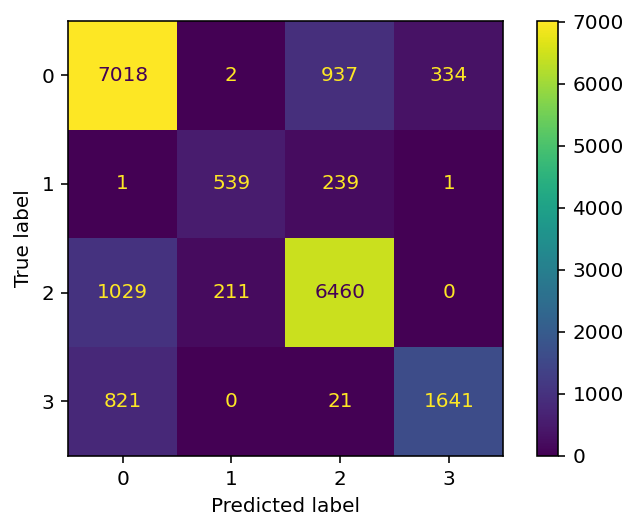

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# The diagonal from the top-left shows the performance on correct predictions
ConfusionMatrixDisplay(forest_cm).plot();

**Macro and Micro Accuracy of Random Forest Classifier**

In [ ]:
# Macro and Micro Accuracy
# Average is assigned micro
micro_accuracy_forest = precision_score(y_test, forest_pred, average='micro')
# Average is assigned macro
macro_accuracy_forest = precision_score(y_test, forest_pred, average='macro')
# Printing micro and macro average precision score
print("Average Micro Accuracy of Random Forest Classifier: ",micro_accuracy_forest)
print("Average Macro Accuracy of Random Forest Classifier: ",macro_accuracy_forest)

Average Micro Accuracy of Random Forest Classifier:  0.8132336137945362
Average Macro Accuracy of Random Forest Classifier:  0.7955472216258772


## **Gradient Boosting Classifier**

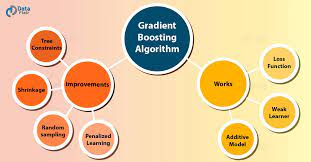

In [ ]:
gb = GradientBoostingClassifier().fit(x_train, y_train)
print("train score - " + str(gb.score(x_train, y_train)))
print("test score - " + str(gb.score(x_test, y_test)))

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train score - 0.8110497954943842
test score - 0.8063778955022333


In [ ]:
gb_pred = gb.predict(x_test)
gb_pred

array([3, 0, 0, ..., 2, 0, 2])

**Confusion Matrix of Gradient Boosting classification**

In [ ]:
#Confusion matrix for support vector machine
from sklearn.metrics import confusion_matrix
gb_cm = confusion_matrix(y_test, gb_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[ 727    0 4565 2999]
 [   0    0  779    1]
 [  48    0 7306  346]
 [ 125    0  373 1985]]

True Positives(TP) =  727

True Negatives(TN) =  0

False Positives(FP) =  0

False Negatives(FN) =  0


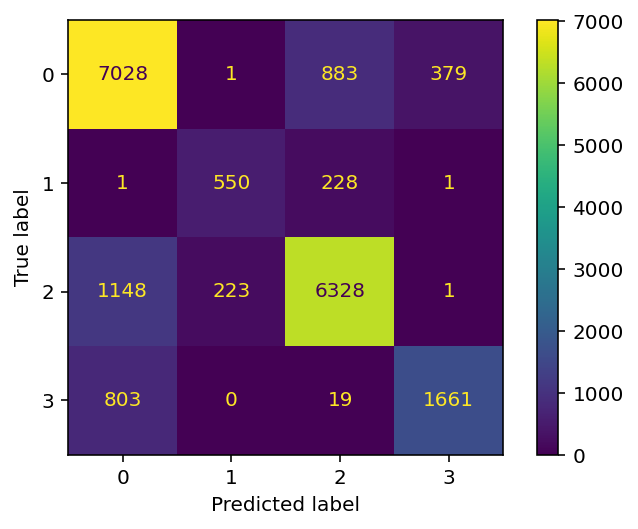

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# The diagonal from the top-left shows the performance on correct predictions
ConfusionMatrixDisplay(gb_cm).plot();

## **After Tunning**
#### Increased learning rate to 0.15 from default 0.1

In [ ]:
gb = GradientBoostingClassifier(random_state=0, learning_rate=0.15).fit(x_train, y_train)
print("train score: " + str(gb.score(x_train, y_train)))
print("test score: " + str(gb.score(x_test, y_test)))

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train score: 0.813049405959878
test score: 0.8085073231536304


**Macro and Micro Accuracy of gradient boosting classifier**

In [ ]:
# Macro and Micro Accuracy
# Average is assigned micro
micro_accuracy_gb = precision_score(y_test, gb_pred, average='micro')
# Average is assigned macro
macro_accuracy_gb = precision_score(y_test, gb_pred, average='macro')
# Printing micro and macro average precision score
print("Average Micro Accuracy of GradientBoosting Classifier: ",micro_accuracy_gb)
print("Average Macro Accuracy of GradientBoosting Classifier: ",macro_accuracy_gb)

Average Micro Accuracy of GradientBoosting Classifier:  0.8085073231536304
Average Macro Accuracy of GradientBoosting Classifier:  0.7887813608812542


## **KNeighbors Classifier**

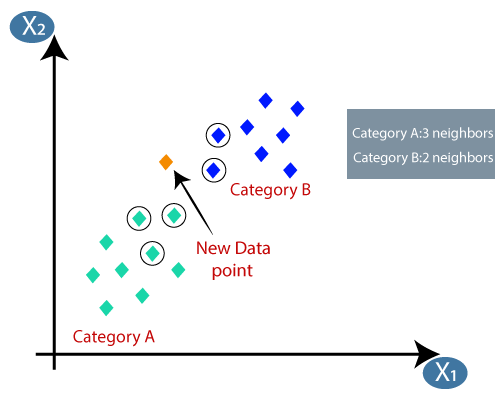

In [ ]:
knr = KNeighborsClassifier(n_neighbors=6).fit(x_train, y_train)
print("train score: " + str(knr.score(x_train, y_train)))
print("test score: " + str(knr.score(x_test, y_test)))

/usr/local/lib/python3.7/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


train score: 0.8017269363111083
test score: 0.7961462553235691


In [ ]:
knr_pred = knr.predict(x_test)
knr_pred

array([3, 0, 0, ..., 2, 0, 2])

**Macro and MicroAccuracy of KNeighbors Classifier**

In [ ]:
# Macro and Micro Accuracy
# Average is assigned micro
micro_accuracy_knn = precision_score(y_test, knr_pred, average='micro')
# Average is assigned macro
macro_accuracy_knn= precision_score(y_test, knr_pred, average='macro')
# Printing micro and macro average precision score
print("Average Micro Accuracy of KNeighbors Classifier: ",micro_accuracy_knn)
print("Average Macro Accuracy of KNeighbors Classifier: ",macro_accuracy_knn)

Average Micro Accuracy of KNeighbors Classifier:  0.7961462553235691
Average Macro Accuracy of KNeighbors Classifier:  0.779713880798883


#### **Final Accurate test score of each classifier**

In [ ]:
print("Support Vector Machine test score: " + str(svc_scaled.score(x_test_scaled, y_test)))
print("Gradient Boosting test score: " + str(gb.score(x_test, y_test)))
print("Decision Tree Classifier test score: " + str(dec.score(x_test, y_test)))
print("KNeighbors Classifier test score: " + str(knr.score(x_test, y_test)))

Support Vector Machine test score: 0.6461514490495481
Gradient Boosting test score: 0.8085073231536304
Decision Tree Classifier test score: 0.7755271631868702
KNeighbors Classifier test score: 0.7961462553235691


## **Predictions of price of cars Using KNN Classifier** 

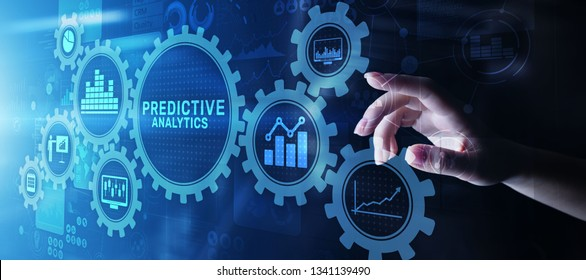

In [ ]:
from sklearn.metrics import log_loss

In [ ]:
knnc = KNeighborsClassifier(11).fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


**Accuracy Score of KNN Classifier**

In [ ]:
knnc.score(x_test, y_test)

0.8031577853952425

**And the log loss of KNN Classifier is below**

In [ ]:
log_loss(y_test, knnc.predict_proba(x_test))

1.0370767218841914

**Now we will compare it with dummy classifier that will predict the majority of class value in price column**

In [ ]:
from sklearn.dummy import DummyClassifier
dummyc = DummyClassifier()
dummyc.fit(x_train, y_train).score(x_test, y_test)

0.43061182092032824

In [ ]:
y_test.value_counts(normalize=True)

price_band
0             0.430612
2             0.399917
3             0.128960
1             0.040511
dtype: float64

In [ ]:
dummyc.predict(x_test)[:5]

array([0, 0, 0, 0, 0])

In [ ]:
log_loss(y_test, dummyc.predict_proba(x_test))

1.1233798953665786

**we are familiar with the fact that not all the classification models gives us predictions only kNN and logistic regression classifier does therefore we will find prediction of price of car using these two classifiers**

In [ ]:
dataframe.reset_index(drop=True, inplace=True)
df = pd.concat([dataframe], axis=1)

**log loss probability of prediction of cars through knn classifier**

In [ ]:
log_loss(y_test, knnc.predict_proba(x_test))

1.0370767218841914

### **Prediction and performance on car prices Using KNN Classifier**

In [ ]:
y_pred_train = knnc.predict(x_train)
y_pred_train

array([0, 0, 2, ..., 1, 0, 0])

**Price prediction of car sales of starting 10 classes of price column**

In [ ]:
y_pred_prob = knnc.predict_proba(x_test)[0:10]
y_pred_prob

array([[0.        , 0.        , 0.        , 1.        ],
       [0.63636364, 0.        , 0.09090909, 0.27272727],
       [0.63636364, 0.        , 0.36363636, 0.        ],
       [0.90909091, 0.        , 0.09090909, 0.        ],
       [0.54545455, 0.        , 0.45454545, 0.        ],
       [0.36363636, 0.        , 0.        , 0.63636364],
       [1.        , 0.        , 0.        , 0.        ],
       [0.81818182, 0.        , 0.09090909, 0.09090909],
       [0.90909091, 0.        , 0.09090909, 0.        ],
       [0.09090909, 0.        , 0.90909091, 0.        ]])

**Price Prediction of car sales of 10 to 30 class values of price column**

In [ ]:
y_pred_prob = knnc.predict_proba(x_test)[10:30]
y_pred_prob

array([[0.45454545, 0.        , 0.        , 0.54545455],
       [0.45454545, 0.        , 0.45454545, 0.09090909],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.27272727, 0.72727273, 0.        ],
       [0.72727273, 0.        , 0.27272727, 0.        ],
       [1.        , 0.        , 0.        , 0.        ],
       [0.        , 0.90909091, 0.09090909, 0.        ],
       [0.36363636, 0.        , 0.        , 0.63636364],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 1.        , 0.        , 0.        ],
       [0.81818182, 0.        , 0.18181818, 0.        ],
       [0.27272727, 0.        , 0.        , 0.72727273],
       [0.72727273, 0.        , 0.09090909, 0.18181818],
       [0.63636364, 0.        , 0.        , 0.36363636],
       [0.09090909, 0.        , 0.90909091, 0.        ],
       [0.45454545, 0.        , 0.54545455, 0.        ],
       [0.81818182, 0.        , 0.18181818, 0.        ],
       [0.90909091, 0.        ,

**Price Prediction of car sales from 30 onwards values of classes in price column**

In [ ]:
y_pred_prob = knnc.predict_proba(x_test)[30:]
y_pred_prob

array([[0.90909091, 0.        , 0.09090909, 0.        ],
       [0.90909091, 0.        , 0.09090909, 0.        ],
       [0.09090909, 0.        , 0.90909091, 0.        ],
       ...,
       [0.        , 0.        , 1.        , 0.        ],
       [0.81818182, 0.        , 0.18181818, 0.        ],
       [0.        , 0.        , 1.        , 0.        ]])

In [ ]:
knnc_pred = knnc.predict(x_test)

knnc_pred

array([3, 0, 0, ..., 2, 0, 2])

**Accuracy Score**

**Model accuracy score of KNeighbors Classifier**

In [ ]:
from sklearn.metrics import accuracy_score

print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, knr_pred)))

Model accuracy score: 0.7961


## **Confusion Matrix**

A confusion matrix is a tool for summarizing the performance of a classification algorithm. A confusion matrix will give us a clear picture of classification model performance and the types of errors produced by the model. It gives us a summary of correct and incorrect predictions broken down by each category. The summary is represented in a tabular form.

Four types of outcomes are possible while evaluating a classification model performance. These four outcomes are described below:-

True Positives (TP) – True Positives occur when we predict an observation belongs to a certain class and the observation actually belongs to that class.

True Negatives (TN) – True Negatives occur when we predict an observation does not belong to a certain class and the observation actually does not belong to that class.

False Positives (FP) – False Positives occur when we predict an observation belongs to a certain class but the observation actually does not belong to that class. This type of error is called Type I error.

False Negatives (FN) – False Negatives occur when we predict an observation does not belong to a certain class but the observation actually belongs to that class. This is a very serious error and it is called Type II error.

These four outcomes are summarized in a confusion matrix given below.

In [ ]:
from sklearn.metrics import confusion_matrix

knnc_cm = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[ 727    0 4565 2999]
 [   0    0  779    1]
 [  48    0 7306  346]
 [ 125    0  373 1985]]

True Positives(TP) =  727

True Negatives(TN) =  0

False Positives(FP) =  0

False Negatives(FN) =  0


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

**confusion matrix of KNeighbors Classifier**

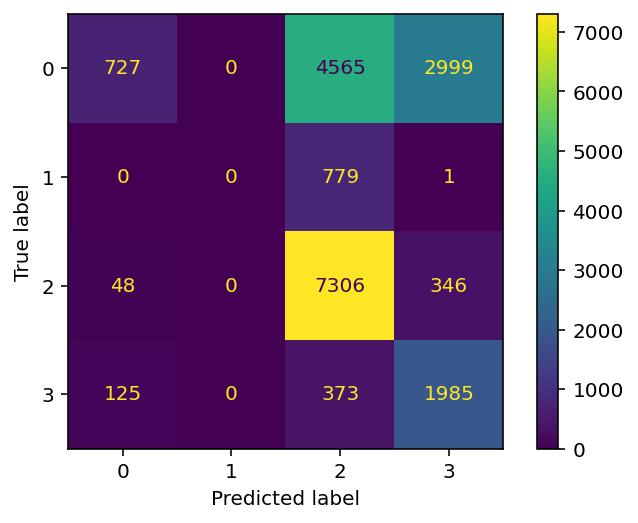

In [ ]:
# The diagonal from the top-left shows the performance on correct predictions
ConfusionMatrixDisplay(knnc_cm).plot();

## **Macro Accuracy of All Classifiers**

In [ ]:
print("Support Vector Machine=",macro_accuracy_svm)
print("Decision Tree Classifier=",macro_accuracy_dec)
print("RandomForest Classifier=",macro_accuracy_forest)
print("KNeighbors Classifier=",macro_accuracy_knn)
print("Gradient Boosting Classifier=",macro_accuracy_gb)

Support Vector Machine= 0.43528390735995376
Decision Tree Classifier= 0.7752753061837965
RandomForest Classifier= 0.7955472216258772
KNeighbors Classifier= 0.779713880798883
Gradient Boosting Classifier= 0.7887813608812542


## **Micro Accuracy of All Classifiers**

In [ ]:
print("Support Vector Machine=",micro_accuracy_svm)
print("Decision Tree Classifier=",micro_accuracy_dec)
print("RandomForest Classifier=",micro_accuracy_forest)
print("KNeighbors Classifier=",micro_accuracy_knn)
print("Gradient Boosting Classifier=",micro_accuracy_gb)

Support Vector Machine= 0.5203074685779578
Decision Tree Classifier= 0.7755271631868702
RandomForest Classifier= 0.8132336137945362
KNeighbors Classifier= 0.7961462553235691
Gradient Boosting Classifier= 0.8085073231536304


## **Conclusion**
I have trained classification models which have different accuracy results and as a result of it y_pred_prob will show the prediction of sales of price of car using probability that what whould be the price of car in future for next 10 outputs and for next 30 and onwards outputs. Conclusion states that the prediction of price of car depends upon the columns standard color, standard model, year of registeration and age where as fuel type and make_model are such factors which doesnt effect the predicted price of sales of car.